In [18]:
%reload_ext autoreload
%autoreload 2

import socket
import os
if socket.gethostname().startswith('ax'):
    path_prefix = '/mnt/smb/locker/miller-locker/users/Tahereh'
    path_codes = '/mnt/smb/locker/miller-locker/users/Tahereh/Codes/Perceptually_Aligned_Gradients/'
    os.chdir(path_codes)
    import sys
    sys.path.append(path_codes)
    sys.path.append('/mnt/smb/locker/miller-locker/users/Tahereh/Codes/Perceptually_Aligned_Gradients/Illusions')
elif socket.gethostname().startswith('demo'):
    path_prefix = '/home/tahereh/engram/users/Tahereh'
    path_codes = '/home/tahereh/engram/users/Tahereh/Codes/Public_Codes/Generative_Inference/'
    os.chdir(path_codes)
    import sys
    sys.path.append(path_codes)
    
print(os.getcwd())

## Settings of results 
fontsize_text = 25
color_text = 'mediumseagreen'
fontsize_text = 12


resultsdir = os.path.join(path_prefix, 'Research/Results/Generative_Inference')

# get the labels for imagenet
from Stimuli.load_stimuli import labels_imagenet


/home/tahereh/engram/users/Tahereh/Codes/Public_Codes/Generative_Inference


In [19]:
import torch

# for face net: 'advrobust_L2_eps_0.50' checkpoint 100
class Args:
    def __init__(self) -> None:
        self.model_arch = 'resnet50'
        
        self.dataset_model = 'imagenet' # 'imagenetvggface2'#'vggface2' #'imagenet'
        self.model_training ='advrobust_L2_eps_3.00' ##'advrobust_L2_eps_0.50' #'advrobust_Linf_eps_4.00' #'advrobust_L2_eps_3.00' #'advrobust_Linf_eps_4.00' #'advrobust_L2_eps_0.50'  'advrobust_L2_eps_3.00' #
        self.input_size = 224
        # self.dataset_model =  'vggface2' #'imagenet' # 'imagenetvggface2'#'vggface2' #'imagenet'
        # self.model_training ='advrobust_L2_eps_0.50' ##'advrob
        
        # self.dataset_model =  'imagenetvggface2'#'vggface2' #'imagenet'
        # self.model_training ='advrobust_L2_eps_3.00' ##'advrob
        
        self.epoch_chkpnt = 'full' #176 #100 #106 #100#'full' # 160 for vggface IncConfMSE #'full' 
        self.eval_dataset_identifier = 'vggface2_test'
        self.batch_size = 32


args = Args()

if args.dataset_model == 'vggface2':
    assert args.model_training == 'advrobust_L2_eps_0.50'
    args. norm_mean = torch.tensor([0.5, 0.5, 0.5]).cuda()
    args.norm_std = torch.tensor([0.5, 0.5, 0.5]).cuda()
    args.n_classes = 500
elif 'imagenet' in  args.dataset_model or 'places365' in args.dataset_model:
    args.norm_mean = torch.tensor([0.485, 0.456, 0.406]).cuda()
    args.norm_std = torch.tensor([0.229, 0.224, 0.225]).cuda()
    args.n_classes = 1000
else:
    raise ValueError(f"Dataset model {args.dataset_model} not supported yet")
          

#'vggface2'  'advrobust_L2_eps_0.50' 'full' 'vggface2_test' 32
# Load the model -----------------------------
model_args = {'model_arch': args.model_arch, 
              'model_training': args.model_training,
              'input_size': args.input_size,
              'dataset': args.dataset_model,
              'epoch_chkpnt': args.epoch_chkpnt,
              'norm_mean': args.norm_mean,
              'norm_std': args.norm_std,
              'n_classes': args.n_classes,
            #   'inference': args.inference
              }

from Models import load_models
model, _ = load_models.load_models(model_args)
model = torch.nn.DataParallel(model).cuda()
_=model.eval()
print(model_args)

args is a dictionary
get_dict_hash: dataset: imagenet, model_arch: resnet50
Loading model from imagenet
Loading model from /home/tahereh/engram/users/Tahereh/Codes/Perceptually_Aligned_Gradients/Training/TrainedModels/train_resnet50_imagenet_eps_3.00/c27e4781-e806-451d-af40-a2e30d88ca6d/checkpoint.pt.best
=> loading checkpoint '/home/tahereh/engram/users/Tahereh/Codes/Perceptually_Aligned_Gradients/Training/TrainedModels/train_resnet50_imagenet_eps_3.00/c27e4781-e806-451d-af40-a2e30d88ca6d/checkpoint.pt.best'
=> loaded checkpoint '/home/tahereh/engram/users/Tahereh/Codes/Perceptually_Aligned_Gradients/Training/TrainedModels/train_resnet50_imagenet_eps_3.00/c27e4781-e806-451d-af40-a2e30d88ca6d/checkpoint.pt.best' (epoch 61)
****** Loaded model from /home/tahereh/engram/users/Tahereh/Codes/Perceptually_Aligned_Gradients/Training/TrainedModels/train_resnet50_imagenet_eps_3.00/c27e4781-e806-451d-af40-a2e30d88ca6d/checkpoint.pt.best
{'model_arch': 'resnet50', 'model_training': 'advrobust_L2

In [34]:
## test the generative inference function
from Stimuli.load_stimuli import ImageLoader
from Inference.Generative_infernece import generative_inference

model_config = {'model': model, 'dataset_model': args.dataset_model, **model_args}
## pretty print the model_config
inference_config = {'loss_infer': 'ReverseDiffusion',# #'IncreaseConfidence', #'ReverseDiffusion', 
                    'loss_function': 'MSE',#'MSE',# #'CE', #'MSE', 
                    'n_itr':101, 
                    'eps': 3, #0.5, 
                    'step_size': 0.5, #3
                    'diffusion_noise_ratio': 0.000,#0.05, 
                    'initial_inference_noise_ratio': 0.2,#0.05, #0.1, 
                    # 'iterations_to_show': [0, 1,  4, 8, 16, 20, 30, 40, 60, 80, 90, 100],
                    'iterations_to_show': [0, 1, 2, 4, 8, 16, 20, 30, 40, 50, 60, 70, 80, 90, 100],
                    # 'iterations_to_show': [0, 1, 2, 4, 16, 32, 64, 80, 100, 200, 400, 500, 600, 700, 800, 900, 1000],
                    'top_layer': 'layer3', #'layer4', #'avgpool', #'all',
                    'inference_normalization': 'off',
                    'recognition_normalization': 'off',
                    'misc_info': {'keep_grads': True,}
                    }



image_name = 'ShadowEffect'#'BlockColorIllusion' #'FigureGroundUniform' #'FigureGroundLamme' ##'FigureGroundTexture' #'FigureGroundUniform' #'FigureGroundLamme'# 'FigureGroundLammeBordersDetected' #'FigureGroundLamme'
image, cmap = ImageLoader(args.dataset_model).load_image(image_name)


selected_inferred_patterns, perceived_categories, confidence_list, misc_info_dict = generative_inference(model_config, image, inference_config)
iteration_numbers = inference_config['iterations_to_show']
if inference_config['misc_info']['keep_grads']:
    selected_grad_patterns = misc_info_dict['grad_info']
else:
    selected_grad_patterns = []

Sequential(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): SequentialWithArgs(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1),

Gen Inf: loss_infer=ReverseDiffusion, loss_function=MSE, noise_ratio=0.2, diffusion_noise_ratio=0.0, n_itr=101, eps=3, step_size=0.5
 model: resnet50-imagenet-resnet50-advrobust_L2_eps_3.00-epochfull-toplayerlayer3


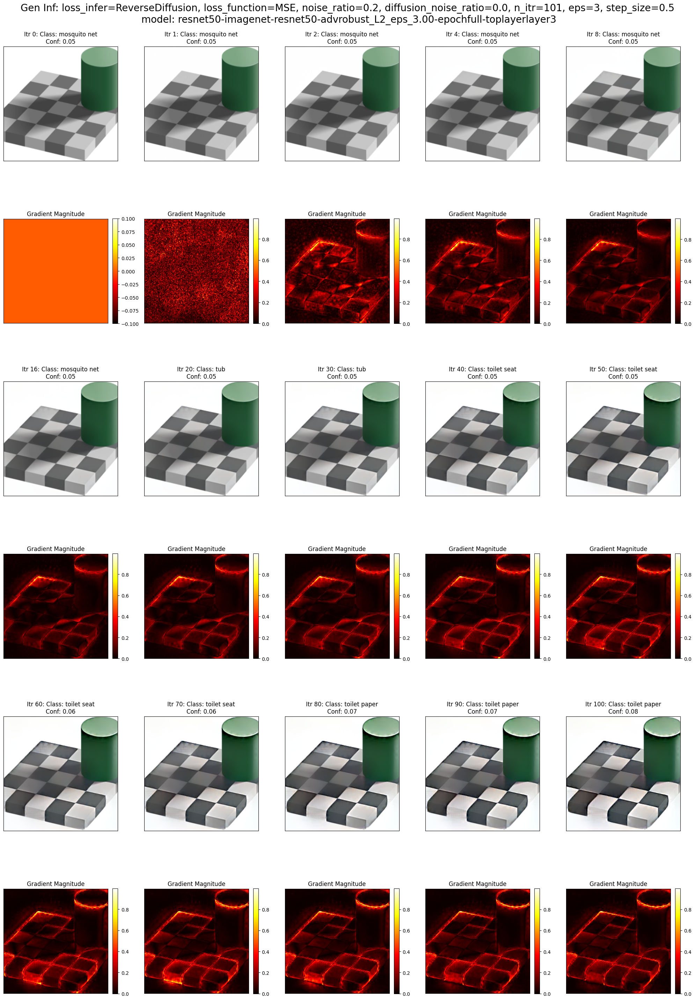

saved at: /home/tahereh/engram/users/Tahereh/Research/Results/Generative_Inference/resnet50_imagenet-advrobust_L2_eps_3.00-full/ShadowEffect_layer3_geninf_imagenet_resnet50_advrobust_L2_eps_3.00_epochfull_ReverseDiffusion_MSE_noise_ratio0.2_diffusion_noise_ratio0.0_n_itr101_eps3_step_size0.5_confitr0_False_with_gradients.pdf


In [35]:
import matplotlib.pyplot as plt
import numpy as np
import os
import torch

# show the images and gradients in a grid - now with 2 rows per pattern
n_cols = 5
n_pattern_rows = len(selected_inferred_patterns)//n_cols + (1 if len(selected_inferred_patterns)%n_cols > 0 else 0)
if n_pattern_rows == 0:
    n_pattern_rows = 1
# Double the rows to accommodate gradients below each image
n_total_rows = n_pattern_rows * 2
fig, axes = plt.subplots(n_total_rows, n_cols, figsize=[20, 5*n_pattern_rows * 2])

if model_config['dataset_model'] == 'vggface2':
    norm_mean = torch.tensor([0.5,0.5,0.5]).view(-1, 1, 1).cuda()
    norm_std = torch.tensor([0.5,0.5,0.5]).view(-1, 1, 1).cuda()
elif model_config['dataset_model'] == 'imagenet' or model_config['dataset_model'] == 'imagenetvggface2':
    norm_mean = torch.tensor([0.485, 0.456, 0.406]).view(-1, 1, 1).cuda()
    norm_std = torch.tensor([0.229, 0.224, 0.225]).view(-1, 1, 1).cuda()

for i in range(len(selected_inferred_patterns)):
    # Calculate positions for image and gradient
    row_idx = (i // n_cols) * 2  # Multiply by 2 to skip rows for gradients
    col_idx = i % n_cols
    
    # Get axes for both image and gradient
    if n_pattern_rows == 1:
        ax_img = axes[0] if n_cols == 1 else axes[col_idx]
        ax_grad = axes[1] if n_cols == 1 else axes[n_cols + col_idx]
    else:
        ax_img = axes[row_idx, col_idx]
        ax_grad = axes[row_idx + 1, col_idx]
        
    # Get the image and corresponding gradients
    image_to_compute = selected_inferred_patterns[i].squeeze(0).detach().cpu().numpy().transpose(1,2,0)
    gradients = selected_grad_patterns[i].squeeze(0).detach().cpu().numpy().transpose(1,2,0)
    
    # Normalize gradients for visualization
    grad_magnitude = np.sqrt(np.sum(gradients**2, axis=2))
    grad_normalized = (grad_magnitude - grad_magnitude.min()) / (grad_magnitude.max() - grad_magnitude.min() + 1e-8)
        
    
    predicted_emotion = 'N/A'
    confidence_emotion = 0
    first_itr_conf_got_high = 0
    emotion_detected = False
    color_title = 'black'
    
    # Plot image in top subplot
    ax_img.imshow(image_to_compute)
    # Plot gradient heatmap in bottom subplot
    gradient_plot = ax_grad.imshow(grad_normalized, cmap='hot')
    plt.colorbar(gradient_plot, ax=ax_grad, fraction=0.046, pad=0.04)
    
    # Set titles
    if model_config['dataset_model'] == 'imagenet':
        ax_img.set_title(f'Itr {iteration_numbers[i]}: Class: {labels_imagenet[perceived_categories[i]]}\nConf: {confidence_list[i]:.2f}', color=color_title)
    else:
        ax_img.set_title(f'Itr {iteration_numbers[i]}: Class: {perceived_categories[i]}\nConf: {confidence_list[i]:.2f}', color=color_title)
    
    ax_grad.set_title('Gradient Magnitude')
    
    # Remove ticks from both subplots
    ax_img.set_xticks([])
    ax_img.set_yticks([])
    ax_grad.set_xticks([])
    ax_grad.set_yticks([])

title = f'Gen Inf: loss_infer={inference_config["loss_infer"]}, loss_function={inference_config["loss_function"]}, noise_ratio={inference_config["initial_inference_noise_ratio"]}, diffusion_noise_ratio={inference_config["diffusion_noise_ratio"]}, n_itr={inference_config["n_itr"]}, eps={inference_config["eps"]}, step_size={inference_config["step_size"]}\n model: {args.model_arch}-{args.dataset_model}-{args.model_arch}-{args.model_training}-epoch{args.epoch_chkpnt}-toplayer{inference_config["top_layer"]}'
if 'smooth_inference' in inference_config['misc_info']:
    title = title + f'\n smooth_inference={inference_config["misc_info"]["smooth_inference"]}, smooth_samples={inference_config["misc_info"]["smooth_samples"]}, smooth_batch_size={inference_config["misc_info"]["smooth_batch_size"]}, smooth_sigma={inference_config["misc_info"]["smooth_sigma"]}, smooth_multiscale={inference_config["misc_info"]["smooth_multiscale"]}'
print(title)

fig.suptitle(title, fontsize=20)

# Remove empty axes
for i in range(n_total_rows):
    for j in range(n_cols):
        pattern_idx = (i//2) * n_cols + j
        if pattern_idx >= len(selected_inferred_patterns):
            if n_pattern_rows > 1:
                fig.delaxes(axes[i, j])

plt.tight_layout()
plt.show()

# Save fi#gure
figsave_dir = os.path.join(resultsdir, f'{args.model_arch}_{args.dataset_model}-{args.model_training}-{args.epoch_chkpnt}/')
if not os.path.exists(figsave_dir):
    os.makedirs(figsave_dir)

fig_name = f'{image_name}_{inference_config["top_layer"]}_geninf_{model_config["dataset_model"]}_{args.model_arch}_{model_config["model_training"]}_epoch{model_config["epoch_chkpnt"]}_{inference_config["loss_infer"]}_{inference_config["loss_function"]}_noise_ratio{inference_config["initial_inference_noise_ratio"]}_diffusion_noise_ratio{inference_config["diffusion_noise_ratio"]}_n_itr{inference_config["n_itr"]}_eps{inference_config["eps"]}_step_size{inference_config["step_size"]}'
fig_name = fig_name + f'_confitr{first_itr_conf_got_high}_{emotion_detected}_with_gradients'
if 'smooth_inference' in inference_config['misc_info']:
    fig_name = fig_name + f'_smooth_inference={inference_config["misc_info"]["smooth_inference"]}, smooth_multiscale={inference_config["misc_info"]["smooth_multiscale"]}'

instance_counter = 0
while os.path.exists(os.path.join(figsave_dir, fig_name+'.pdf')):
    print('file already exists, adding instance number')
    if 'instance' in fig_name:
        fig_name = fig_name.split('_instance')[0]
    fig_name = fig_name + f'_instance{instance_counter}'
    instance_counter += 1

fig.savefig(os.path.join(figsave_dir, fig_name+'.pdf'), dpi=300, bbox_inches='tight')

print('saved at:', os.path.join(figsave_dir, fig_name+'.pdf'))

# Save results dictionary
dict_results = {
    'model_config': model_config,
    'inference_config': inference_config,
    'selected_inferred_patterns': selected_inferred_patterns,
    'selected_grad_patterns': selected_grad_patterns,
    'perceived_categories': perceived_categories,
    'iteration_numbers': iteration_numbers,
    # 'contrast_list': contrast_list,
    # 'predicted_emotion_list': predicted_emotion_list,
    # 'confidence_emotion_list': confidence_emotion_list
}
np.save(os.path.join(figsave_dir, fig_name+'.npy'), dict_results)

In [8]:
## save a copy of the resulted fig in the resultsdir
path_save_a_copy_significant = os.path.join(resultsdir,'Selected_to_inspect',  fig_name+'.pdf')

fig.savefig(path_save_a_copy_significant, dpi=300, bbox_inches='tight')
print('saved a copy of the resulted fig at:', path_save_a_copy_significant)

saved a copy of the resulted fig at: /home/tahereh/engram/users/Tahereh/Research/Results/Generative_Inference/Selected_to_inspect/ShadowEffect_layer3_geninf_imagenet_resnet50_advrobust_L2_eps_3.00_epochfull_ReverseDiffusion_MSE_noise_ratio0.2_diffusion_noise_ratio0.001_n_itr101_eps3_step_size1_confitr0_False_with_gradients.pdf


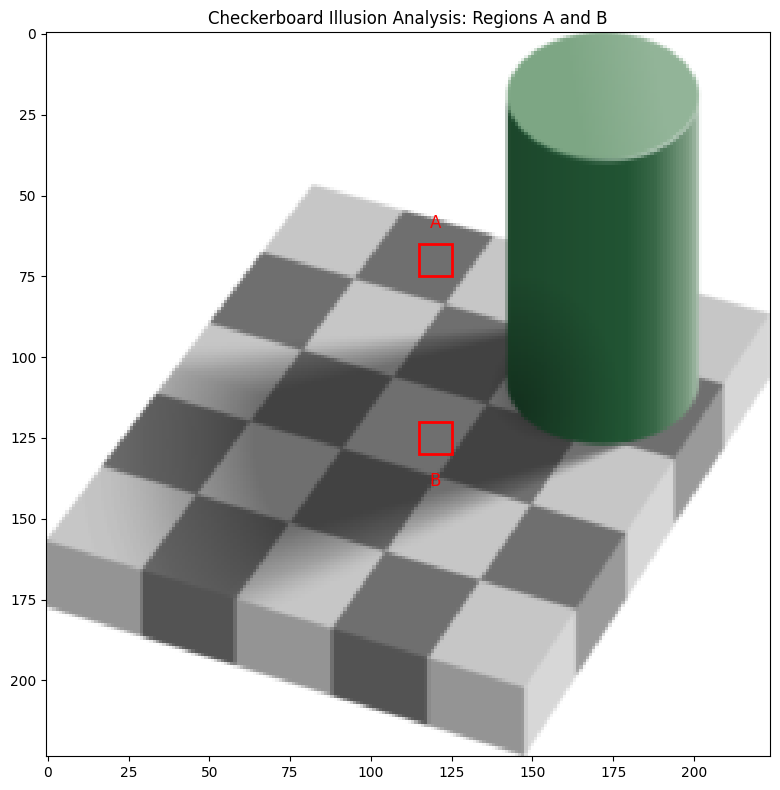

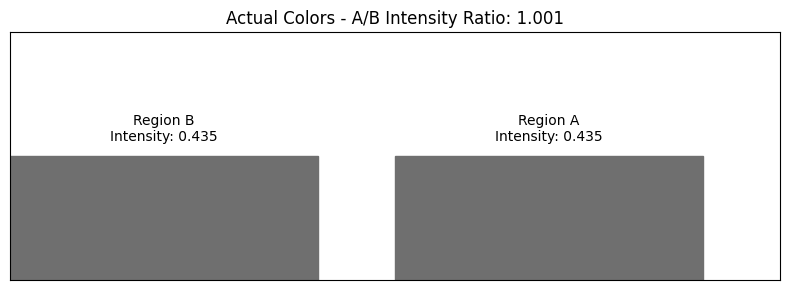


Checkerboard Illusion Analysis Results
--------------------------------------------------
Region A RGB: (0.435, 0.435, 0.435)
Region B RGB: (0.435, 0.435, 0.435)
Region A Intensity: 0.435
Region B Intensity: 0.435
A/B Intensity Ratio: 1.001

Regions A and B have nearly identical intensity values (within 5%).


In [27]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as patches
from torchvision import transforms

def analyze_checkerboard_illusion(image):
    """
    Analyze the intensity of regions A and B in a checkerboard illusion image.
    
    Args:
        image_path: Path to the image file
    
    Returns:
        Dictionary containing intensity analysis results
    """
    # Load the image
    # resize the image to 224 x 224
    
    img = transforms.Resize((224, 224))(image)
    img = transforms.CenterCrop(224)(img)
    img_array = np.array(img).astype(float) / 255.0  # Normalize to 0-1 range
    
    # Create figure to show sampled regions
    fig, ax = plt.subplots(figsize=(10, 8))
    ax.imshow(img_array)
    
    # Define coordinates for regions A and B
    # These will need adjustment based on your specific image
    square_A_x, square_A_y = 120, 70  # Adjust these coordinates for your image
    square_B_x, square_B_y = 120, 125  # Adjust these coordinates for your image
    
    # Size of the sampling region
    sample_size = 10
    half_size = sample_size // 2
    
    # Sample regions A and B
    region_A = img_array[square_A_y-half_size:square_A_y+half_size+1, 
                         square_A_x-half_size:square_A_x+half_size+1]
    
    region_B = img_array[square_B_y-half_size:square_B_y+half_size+1, 
                         square_B_x-half_size:square_B_x+half_size+1]
    
    # Calculate average RGB values
    if len(img_array.shape) == 3:  # Color image (RGB)
        A_rgb = np.mean(region_A, axis=(0, 1))
        B_rgb = np.mean(region_B, axis=(0, 1))
        
        # Calculate intensity (grayscale equivalent)
        A_intensity = 0.299*A_rgb[0] + 0.587*A_rgb[1] + 0.114*A_rgb[2]
        B_intensity = 0.299*B_rgb[0] + 0.587*B_rgb[1] + 0.114*B_rgb[2]
    else:  # Grayscale image
        A_rgb = np.mean(region_A)
        B_rgb = np.mean(region_B)
        A_intensity = A_rgb
        B_intensity = B_rgb
    
    # Calculate A/B ratio
    ratio = A_intensity / B_intensity
    
    # Draw sample regions on the image
    rect_A = patches.Rectangle((square_A_x-half_size, square_A_y-half_size), 
                              sample_size, sample_size, 
                              linewidth=2, edgecolor='red', facecolor='none')
    rect_B = patches.Rectangle((square_B_x-half_size, square_B_y-half_size), 
                              sample_size, sample_size, 
                              linewidth=2, edgecolor='red', facecolor='none')
    
    ax.add_patch(rect_A)
    ax.add_patch(rect_B)
    
    # Add labels A and B
    ax.text(square_A_x, square_A_y-half_size-5, 'A', color='red', fontsize=12, ha='center')
    ax.text(square_B_x, square_B_y+half_size+10, 'B', color='red', fontsize=12, ha='center')
    
    ax.set_title('Checkerboard Illusion Analysis: Regions A and B')
    plt.tight_layout()
    plt.show()
    
    # Create visualization of actual colors
    fig, ax = plt.subplots(figsize=(8, 3))
    
    # Create color patches for A and B
    if len(img_array.shape) == 3:  # Color image
        color_A = A_rgb
        color_B = B_rgb
    else:  # Grayscale image
        color_A = [A_rgb, A_rgb, A_rgb]
        color_B = [B_rgb, B_rgb, B_rgb]
    
    # Draw color patches
    rect_width = 2
    ax.add_patch(patches.Rectangle((0, 0), rect_width, 1, color=color_B))
    ax.add_patch(patches.Rectangle((rect_width+0.5, 0), rect_width, 1, color=color_A))
    
    # Add labels and values
    ax.text(rect_width/2, 1.1, f'Region B\nIntensity: {B_intensity:.3f}', 
            ha='center', va='bottom')
    ax.text(rect_width+0.5+rect_width/2, 1.1, f'Region A\nIntensity: {A_intensity:.3f}', 
            ha='center', va='bottom')
    
    # Set limits and remove ticks
    ax.set_xlim(0, 2*rect_width+1)
    ax.set_ylim(0, 2)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'Actual Colors - A/B Intensity Ratio: {ratio:.3f}')
    
    plt.tight_layout()
    plt.show()
    
    # Print results
    print("\nCheckerboard Illusion Analysis Results")
    print("-" * 50)
    if len(img_array.shape) == 3:  # Color image
        print(f"Region A RGB: ({A_rgb[0]:.3f}, {A_rgb[1]:.3f}, {A_rgb[2]:.3f})")
        print(f"Region B RGB: ({B_rgb[0]:.3f}, {B_rgb[1]:.3f}, {B_rgb[2]:.3f})")
    print(f"Region A Intensity: {A_intensity:.3f}")
    print(f"Region B Intensity: {B_intensity:.3f}")
    print(f"A/B Intensity Ratio: {ratio:.3f}")
    
    if abs(ratio - 1.0) < 0.05:
        print("\nRegions A and B have nearly identical intensity values (within 5%).")
    elif abs(ratio - 1.0) < 0.1:
        print("\nRegions A and B have similar intensity values (within 10%).")
    else:
        print(f"\nRegions A and B have different intensity values (ratio: {ratio:.3f}).")
    
    # Return results dictionary
    return {
        'A_rgb': A_rgb,
        'B_rgb': B_rgb,
        'A_intensity': A_intensity,
        'B_intensity': B_intensity,
        'A_B_ratio': ratio
    }

# Usage example:
results = analyze_checkerboard_illusion(image)

## Compare the intensity on the checkerboard

Image 0 shape: torch.Size([1, 3, 224, 224]), type: torch.float32
Image 0 value range: 0.07450980693101883 to 1.0
Square A raw values (first few):
[[[0.43529412 0.43529412 0.43529412]
  [0.43529412 0.43529412 0.43529412]
  [0.43529412 0.43529412 0.43529412]]

 [[0.43529412 0.43529412 0.43529412]
  [0.43529412 0.43529412 0.43529412]
  [0.43529412 0.43529412 0.43529412]]

 [[0.43529412 0.43529412 0.43529412]
  [0.43529412 0.43529412 0.43529412]
  [0.43529412 0.43529412 0.43529412]]]
Square B raw values (first few):
[[[0.43529412 0.43529412 0.43529412]
  [0.43529412 0.43529412 0.43529412]
  [0.43529412 0.43529412 0.43529412]]

 [[0.43529412 0.43529412 0.43529412]
  [0.43529412 0.43529412 0.43529412]
  [0.43529412 0.43529412 0.43529412]]

 [[0.43529412 0.43529412 0.43529412]
  [0.43529412 0.43529412 0.43529412]
  [0.43529412 0.43529412 0.43529412]]]
Image 1 shape: torch.Size([1, 3, 224, 224]), type: torch.float32
Image 1 value range: 0.0752275213599205 to 1.0
Image 2 shape: torch.Size([1, 3

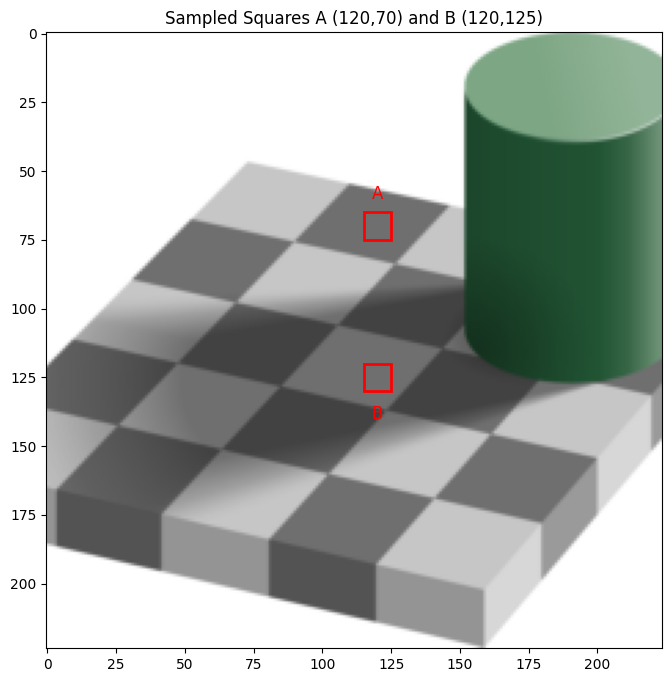

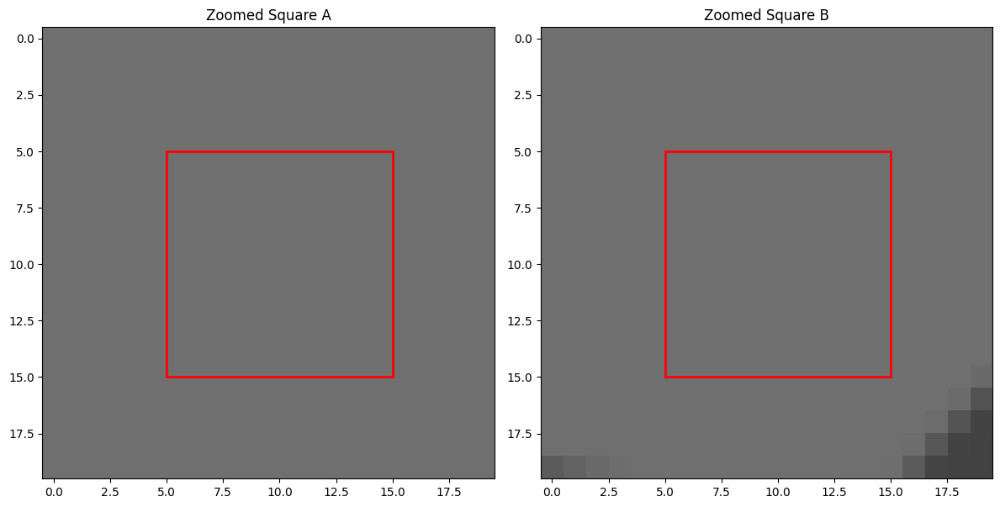

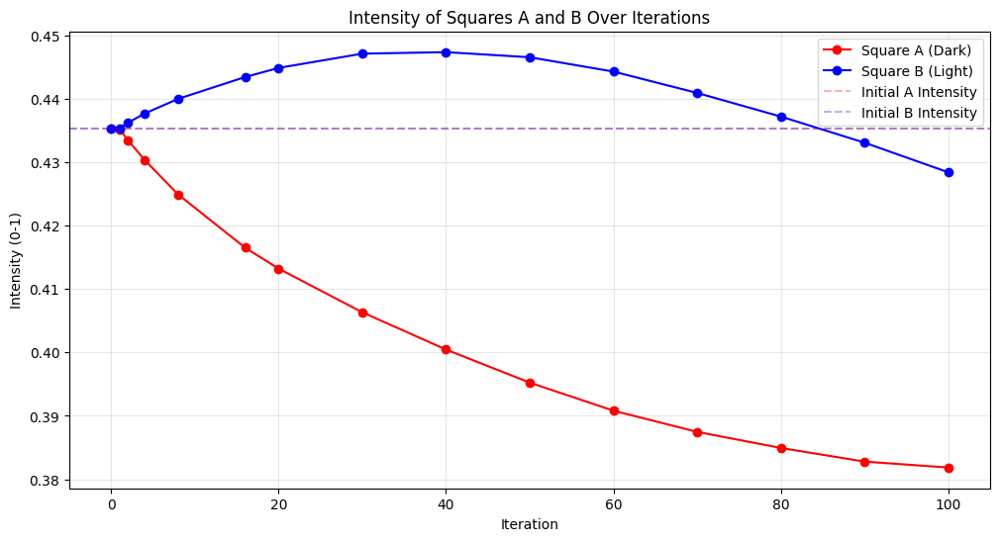

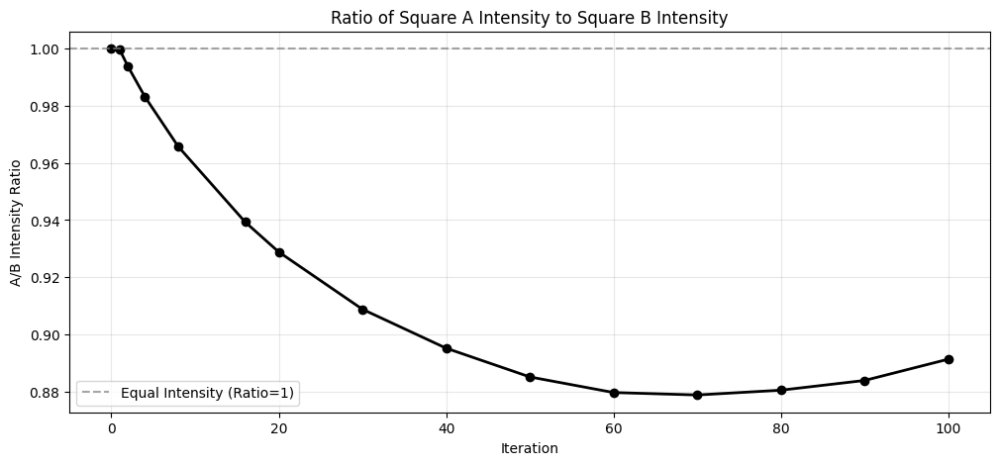

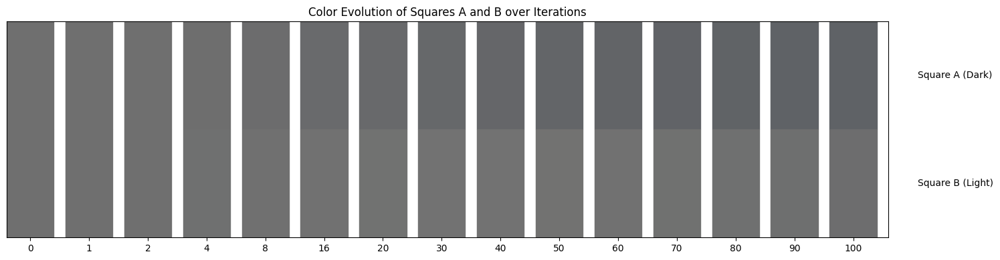


Detailed Analysis of Squares A and B
----------------------------------------------------------------------------------------------------
Iteration  | Square A RGB              | Square A Intensity | Square B RGB              | Square B Intensity | A/B Ratio 
----------------------------------------------------------------------------------------------------
0          | (0.435, 0.435, 0.435) | 0.435 | (0.435, 0.435, 0.435) | 0.435 | 1.000
1          | (0.435, 0.435, 0.435) | 0.435 | (0.435, 0.436, 0.435) | 0.435 | 1.000
2          | (0.433, 0.433, 0.434) | 0.433 | (0.436, 0.436, 0.436) | 0.436 | 0.994
4          | (0.430, 0.430, 0.432) | 0.430 | (0.437, 0.438, 0.437) | 0.438 | 0.983
8          | (0.424, 0.425, 0.428) | 0.425 | (0.439, 0.441, 0.439) | 0.440 | 0.966
16         | (0.414, 0.417, 0.422) | 0.417 | (0.442, 0.444, 0.442) | 0.443 | 0.939
20         | (0.410, 0.414, 0.420) | 0.413 | (0.444, 0.446, 0.443) | 0.445 | 0.929
30         | (0.402, 0.407, 0.416) | 0.406 | (0.446, 0.44

In [36]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.patches import Rectangle

# Function to extract and analyze specific squares (A and B) in the checkerboard
def analyze_checkerboard_squares(images, iteration_numbers):
    # Define the results storage
    results = {
        'iteration': [],
        'square_A_rgb': [],
        'square_A_hex': [],
        'square_B_rgb': [],
        'square_B_hex': [],
        'square_A_intensity': [],
        'square_B_intensity': []
    }
    
    # Define coordinates for squares A and B - USING CONSISTENT VALUES
    # Square A is the dark square with green cylinder shadow
    square_A_y = 70  # y-coordinate for square A
    square_A_x = 120  # x-coordinate for square A
    
    # Square B is the light square outside the shadow
    square_B_y = 125  # y-coordinate for square B
    square_B_x = 120  # x-coordinate for square B
    
    # Size of the sampling region (smaller than the square to avoid edges)
    sample_size = 10
    half_size = sample_size // 2
    
    # Analyze each image
    for i, img in enumerate(images):
        # Debug: Print the type and shape of the image
        print(f"Image {i} shape: {img.shape}, type: {img.dtype}")
        
        # Convert from tensor to numpy array
        img_np = img.squeeze(0).detach().cpu().numpy()
        
        # Debug: Print the min/max values before any processing
        print(f"Image {i} value range: {img_np.min()} to {img_np.max()}")
        
        # Extract sampling regions for squares A and B
        square_A_region = img_np[:, 
                              square_A_y-half_size:square_A_y+half_size, 
                              square_A_x-half_size:square_A_x+half_size]
        
        square_B_region = img_np[:, 
                              square_B_y-half_size:square_B_y+half_size, 
                              square_B_x-half_size:square_B_x+half_size]
        
        # Print raw values for iteration 0 to debug
        if i == 0:
            print("Square A raw values (first few):")
            print(square_A_region[:, 0:3, 0:3])
            print("Square B raw values (first few):")
            print(square_B_region[:, 0:3, 0:3])
        
        # Compute average RGB values (transpose to have RGB as last dimension)
        square_A_rgb = np.mean(square_A_region.transpose(1, 2, 0), axis=(0, 1))
        square_B_rgb = np.mean(square_B_region.transpose(1, 2, 0), axis=(0, 1))
        
        # Calculate intensity (grayscale equivalent)
        square_A_intensity = 0.299*square_A_rgb[0] + 0.587*square_A_rgb[1] + 0.114*square_A_rgb[2]
        square_B_intensity = 0.299*square_B_rgb[0] + 0.587*square_B_rgb[1] + 0.114*square_B_rgb[2]
        
        # Replace NaN values if any
        square_A_rgb = np.nan_to_num(square_A_rgb, nan=0.0)
        square_B_rgb = np.nan_to_num(square_B_rgb, nan=0.0)
        
        # Ensure values are in 0-1 range (clip if necessary)
        square_A_rgb = np.clip(square_A_rgb, 0, 1)
        square_B_rgb = np.clip(square_B_rgb, 0, 1)
        
        # Convert to hex for better visualization
        try:
            square_A_hex = mcolors.to_hex(square_A_rgb)
            square_B_hex = mcolors.to_hex(square_B_rgb)
        except ValueError:
            # Fallback in case of conversion error
            square_A_hex = "#808080"  # Default gray
            square_B_hex = "#FFFFFF"  # Default white
        
        # Store results
        results['iteration'].append(iteration_numbers[i])
        results['square_A_rgb'].append(square_A_rgb)
        results['square_A_hex'].append(square_A_hex)
        results['square_B_rgb'].append(square_B_rgb)
        results['square_B_hex'].append(square_B_hex)
        results['square_A_intensity'].append(square_A_intensity)
        results['square_B_intensity'].append(square_B_intensity)
    
    return results

# Analyze the images
checkerboard_results = analyze_checkerboard_squares(selected_inferred_patterns, iteration_numbers)

# Create visualization showing the sampled areas
fig, ax = plt.subplots(figsize=(10, 8))

# Display the first image
example_img = selected_inferred_patterns[0].squeeze(0).detach().cpu().numpy().transpose(1, 2, 0)
example_img = np.clip(example_img, 0, 1)  # Ensure values are in valid range
ax.imshow(example_img)

# USING THE SAME COORDINATES as in the analysis function
square_A_y, square_A_x = 70, 120  # y,x coordinates for square A
square_B_y, square_B_x = 125, 120  # y,x coordinates for square B
sample_size = 10
half_size = sample_size // 2

# Draw rectangles around the sampled regions
ax.add_patch(Rectangle((square_A_x-half_size, square_A_y-half_size), 
                        sample_size, sample_size, 
                        linewidth=2, edgecolor='red', facecolor='none'))
ax.add_patch(Rectangle((square_B_x-half_size, square_B_y-half_size), 
                        sample_size, sample_size, 
                        linewidth=2, edgecolor='red', facecolor='none'))

# Add labels
ax.text(square_A_x, square_A_y-half_size-5, 'A', color='red', fontsize=12, ha='center')
ax.text(square_B_x, square_B_y+half_size+10, 'B', color='red', fontsize=12, ha='center')

# Add a title showing the coordinates used
ax.set_title(f'Sampled Squares A ({square_A_x},{square_A_y}) and B ({square_B_x},{square_B_y})')
plt.show()

# Create a zoomed-in version to inspect the sample areas
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Get the regions - same as in the analysis function
zoom_factor = 2  # How much to zoom in
region_size = sample_size * zoom_factor

# Create zoomed views of the squares
ax1.imshow(example_img[square_A_y-region_size//2:square_A_y+region_size//2, 
                       square_A_x-region_size//2:square_A_x+region_size//2])
ax1.add_patch(Rectangle((region_size//2-half_size, region_size//2-half_size), 
                        sample_size, sample_size, 
                        linewidth=2, edgecolor='red', facecolor='none'))
ax1.set_title('Zoomed Square A')

ax2.imshow(example_img[square_B_y-region_size//2:square_B_y+region_size//2, 
                       square_B_x-region_size//2:square_B_x+region_size//2])
ax2.add_patch(Rectangle((region_size//2-half_size, region_size//2-half_size), 
                        sample_size, sample_size, 
                        linewidth=2, edgecolor='red', facecolor='none'))
ax2.set_title('Zoomed Square B')

plt.tight_layout()
plt.show()

# Plot intensity values of squares A and B over iterations
plt.figure(figsize=(12, 6))
plt.plot(checkerboard_results['iteration'], checkerboard_results['square_A_intensity'], 'r-o', label='Square A (Dark)')
plt.plot(checkerboard_results['iteration'], checkerboard_results['square_B_intensity'], 'b-o', label='Square B (Light)')
plt.axhline(y=checkerboard_results['square_A_intensity'][0], color='r', linestyle='--', alpha=0.3, label='Initial A Intensity')
plt.axhline(y=checkerboard_results['square_B_intensity'][0], color='b', linestyle='--', alpha=0.3, label='Initial B Intensity')
plt.title('Intensity of Squares A and B Over Iterations')
plt.xlabel('Iteration')
plt.ylabel('Intensity (0-1)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# Calculate A/B intensity ratio
intensity_ratio = np.array(checkerboard_results['square_A_intensity']) / np.array(checkerboard_results['square_B_intensity'])

# Plot the A/B intensity ratio
plt.figure(figsize=(12, 5))
plt.plot(checkerboard_results['iteration'], intensity_ratio, 'k-o', linewidth=2)
plt.axhline(y=1.0, color='gray', linestyle='--', alpha=0.7, label='Equal Intensity (Ratio=1)')
plt.title('Ratio of Square A Intensity to Square B Intensity')
plt.xlabel('Iteration')
plt.ylabel('A/B Intensity Ratio')
plt.grid(True, alpha=0.3)
plt.legend()
plt.show()

# Create visualization of color evolution
n_iterations = len(checkerboard_results['iteration'])
fig, ax = plt.subplots(figsize=(15, 4))

# Set figure dimensions and positions
bar_height = 1.0
total_height = bar_height * 2
y_offset = 0  # No gap between rows

# Create color swatches for both squares in a single axis
for i in range(n_iterations):
    # Square A colors (top row)
    ax.add_patch(plt.Rectangle((i, y_offset + bar_height), 0.8, bar_height, 
                              color=checkerboard_results['square_A_hex'][i]))
    # Square B colors (bottom row)
    ax.add_patch(plt.Rectangle((i, y_offset), 0.8, bar_height, 
                              color=checkerboard_results['square_B_hex'][i]))

# Add labels on the right side
ax.text(n_iterations + 0.5, y_offset + bar_height/2, 'Square B (Light)', 
        verticalalignment='center', fontsize=10)
ax.text(n_iterations + 0.5, y_offset + bar_height + bar_height/2, 'Square A (Dark)', 
        verticalalignment='center', fontsize=10)

# Set the axis limits and labels
ax.set_xlim(0, n_iterations)
ax.set_ylim(0, total_height)
ax.set_xticks(np.arange(n_iterations) + 0.4)
ax.set_xticklabels(checkerboard_results['iteration'])
ax.set_title('Color Evolution of Squares A and B over Iterations')

# Remove y-axis ticks
ax.set_yticks([])

# Ensure square appearance
ax.set_aspect('auto')
plt.tight_layout()
plt.show()

# Print detailed results in a table
print("\nDetailed Analysis of Squares A and B")
print("-" * 100)
print(f"{'Iteration':<10} | {'Square A RGB':<25} | {'Square A Intensity':<15} | {'Square B RGB':<25} | {'Square B Intensity':<15} | {'A/B Ratio':<10}")
print("-" * 100)
for i in range(n_iterations):
    A_rgb = checkerboard_results['square_A_rgb'][i]
    B_rgb = checkerboard_results['square_B_rgb'][i]
    A_int = checkerboard_results['square_A_intensity'][i]
    B_int = checkerboard_results['square_B_intensity'][i]
    ratio = intensity_ratio[i]
    
    print(f"{checkerboard_results['iteration'][i]:<10} | " +
          f"({A_rgb[0]:.3f}, {A_rgb[1]:.3f}, {A_rgb[2]:.3f}) | " +
          f"{A_int:.3f} | " +
          f"({B_rgb[0]:.3f}, {B_rgb[1]:.3f}, {B_rgb[2]:.3f}) | " +
          f"{B_int:.3f} | " +
          f"{ratio:.3f}")

In [20]:
len(selected_inferred_patterns), n_iterations, iteration_numbers

(15, 15, [0, 1, 2, 4, 8, 16, 20, 30, 40, 50, 60, 70, 80, 90, 100])

## Compare colors of Block

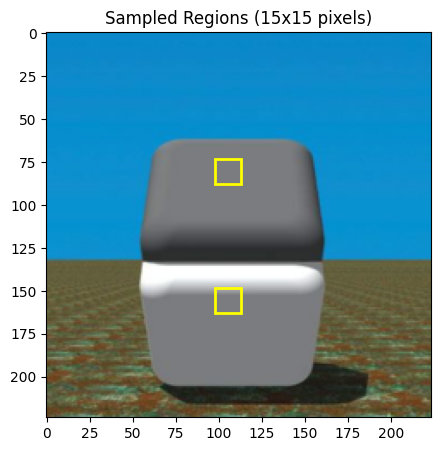


Detailed Color Analysis
--------------------------------------------------------------------------------
Iteration  | Upper RGB                 | Upper HEX  | Lower RGB                 | Lower HEX 
--------------------------------------------------------------------------------
0          | (0.482, 0.486, 0.502) | #7b7c80    | (0.482, 0.486, 0.502) | #7b7c80   
1          | (0.482, 0.486, 0.503) | #7b7c80    | (0.482, 0.486, 0.502) | #7b7c80   
2          | (0.484, 0.486, 0.501) | #7b7c80    | (0.483, 0.487, 0.507) | #7b7c81   
4          | (0.488, 0.486, 0.500) | #7c7c7f    | (0.485, 0.491, 0.514) | #7c7d83   
8          | (0.495, 0.486, 0.497) | #7e7c7f    | (0.491, 0.497, 0.529) | #7d7f87   
16         | (0.510, 0.487, 0.491) | #827c7d    | (0.496, 0.511, 0.562) | #7f828f   
20         | (0.519, 0.489, 0.489) | #847d7d    | (0.499, 0.519, 0.579) | #7f8494   
30         | (0.540, 0.491, 0.482) | #8a7d7b    | (0.509, 0.541, 0.623) | #828a9f   
40         | (0.558, 0.494, 0.479) | #8e

In [34]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Function to extract and analyze the middle 15x15 pixels of upper and lower parts
def analyze_cube_colors(images, iteration_numbers):
    # Define the results storage
    results = {
        'iteration': [],
        'upper_rgb': [],
        'upper_hex': [],
        'lower_rgb': [],
        'lower_hex': []
    }
    
    # Image dimensions
    img_height = images[0].shape[1]
    img_width = images[0].shape[2]
    
    # Based on the image shown, adjust the centers to target the correct areas
    upper_center_y = 100  # Adjusted slightly down
    lower_center_y = 190  # Adjusted slightly down
    center_x = 130  # Adjusted slightly right
    
    # Size of the sampling region
    sample_size = 15
    half_size = sample_size // 2
    
    # Analyze each image
    for i, img in enumerate(images):
        img_np = img.squeeze(0).detach().cpu().numpy()
        
        # Extract 15x15 regions
        upper_region = img_np[:, 
                             upper_center_y-half_size:upper_center_y+half_size+1, 
                             center_x-half_size:center_x+half_size+1]
        
        lower_region = img_np[:, 
                             lower_center_y-half_size:lower_center_y+half_size+1, 
                             center_x-half_size:center_x+half_size+1]
        
        # Compute average RGB values (transpose to have RGB as last dimension)
        upper_rgb = np.mean(upper_region.transpose(1, 2, 0), axis=(0, 1))
        lower_rgb = np.mean(lower_region.transpose(1, 2, 0), axis=(0, 1))
        
        # Replace NaN values if any
        upper_rgb = np.nan_to_num(upper_rgb, nan=0.0)
        lower_rgb = np.nan_to_num(lower_rgb, nan=0.0)
        
        # Ensure values are in 0-1 range (clip if necessary)
        upper_rgb = np.clip(upper_rgb, 0, 1)
        lower_rgb = np.clip(lower_rgb, 0, 1)
        
        # Convert to hex for better visualization (safely)
        try:
            upper_hex = mcolors.to_hex(upper_rgb)
            lower_hex = mcolors.to_hex(lower_rgb)
        except ValueError:
            # Fallback in case of conversion error
            upper_hex = "#808080"  # Default gray
            lower_hex = "#FFFFFF"  # Default white
        
        # Store results
        results['iteration'].append(iteration_numbers[i])
        results['upper_rgb'].append(upper_rgb)
        results['lower_rgb'].append(lower_rgb)
        results['upper_hex'].append(upper_hex)
        results['lower_hex'].append(lower_hex)
    
    return results

# Analyze the images
color_results = analyze_cube_colors(selected_inferred_patterns, iteration_numbers)



# Add an additional visualization to show the sampled regions
plt.figure(figsize=(10, 5))
example_img = selected_inferred_patterns[0].squeeze(0).detach().cpu().numpy().transpose(1, 2, 0)
example_img = np.clip(example_img, 0, 1)  # Ensure values are in valid range

plt.imshow(example_img)

# Highlight the sampled areas with adjusted coordinates
upper_center_y = 80
lower_center_y = 155
center_x = 105
sample_size = 15
half_size = sample_size // 2

# Draw rectangles around the sampled regions
from matplotlib.patches import Rectangle
plt.gca().add_patch(Rectangle((center_x-half_size, upper_center_y-half_size), 
                               sample_size, sample_size, 
                               linewidth=2, edgecolor='yellow', facecolor='none'))
plt.gca().add_patch(Rectangle((center_x-half_size, lower_center_y-half_size), 
                               sample_size, sample_size, 
                               linewidth=2, edgecolor='yellow', facecolor='none'))

plt.title('Sampled Regions (15x15 pixels)')
plt.show()

# Print detailed results in a table
print("\nDetailed Color Analysis")
print("-" * 80)
print(f"{'Iteration':<10} | {'Upper RGB':<25} | {'Upper HEX':<10} | {'Lower RGB':<25} | {'Lower HEX':<10}")
print("-" * 80)
for i in range(n_iterations):
    upper_rgb = color_results['upper_rgb'][i]
    lower_rgb = color_results['lower_rgb'][i]
    print(f"{color_results['iteration'][i]:<10} | " +
          f"({upper_rgb[0]:.3f}, {upper_rgb[1]:.3f}, {upper_rgb[2]:.3f}) | " +
          f"{color_results['upper_hex'][i]:<10} | " +
          f"({lower_rgb[0]:.3f}, {lower_rgb[1]:.3f}, {lower_rgb[2]:.3f}) | " +
          f"{color_results['lower_hex'][i]:<10}")

# Save the color analysis results
# np.save(os.path.join(figsave_dir, fig_name+'_color_analysis.npy'), color_results)
# print(f"\nColor analysis saved to: {os.path.join(figsave_dir, fig_name+'_color_analysis.npy')}")

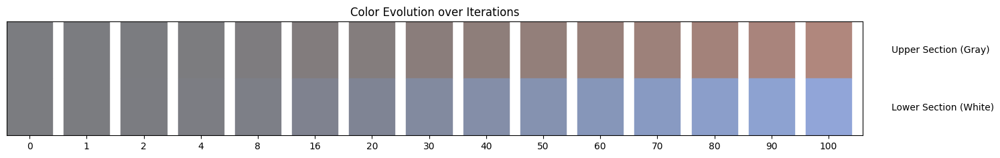

saved at: /home/tahereh/engram/users/Tahereh/Research/Results/Generative_Inference/resnet50_imagenet-advrobust_L2_eps_3.00-100/BlockColorIllusion_layer3_geninf_imagenet_resnet50_advrobust_L2_eps_3.00_epoch100_ReverseDiffusion_MSE_noise_ratio0.5_diffusion_noise_ratio0.005_n_itr101_eps20_step_size0.8_confitr0_False_with_gradients_instance1_color_evolution_color_evolution.pdf


In [32]:
# Display color swatches for each iteration without space between rows
n_iterations = len(color_results['iteration'])
fig, ax = plt.subplots(figsize=(15, 6))

# Set figure dimensions and positions with square-like proportions
bar_width = 0.8
bar_height = 1.0
total_height = bar_height * 2
y_offset = 0  # No gap between rows

# Create color swatches for both parts in a single axis
for i in range(n_iterations):
    # Upper part colors (top row)
    ax.add_patch(plt.Rectangle((i, y_offset + bar_height), bar_width, bar_height, 
                              color=color_results['upper_hex'][i]))
    # Lower part colors (bottom row)
    ax.add_patch(plt.Rectangle((i, y_offset), bar_width, bar_height, 
                              color=color_results['lower_hex'][i]))

# Add labels on the right side
ax.text(n_iterations + 0.5, y_offset + bar_height/2, 'Lower Section (White)', 
        verticalalignment='center', fontsize=10)
ax.text(n_iterations + 0.5, y_offset + bar_height + bar_height/2, 'Upper Section (Gray)', 
        verticalalignment='center', fontsize=10)

# Set the axis limits and labels
ax.set_xlim(0, n_iterations)
ax.set_ylim(0, total_height)
ax.set_xticks(np.arange(n_iterations) + 0.4)
ax.set_xticklabels(color_results['iteration'])
ax.set_title('Color Evolution over Iterations')

# Remove y-axis ticks as they're not meaningful
ax.set_yticks([])

# Adjust the aspect ratio to make squares appear more square-like
plt.gca().set_aspect('equal', adjustable='box')

plt.tight_layout()
plt.show()
fig_name = fig_name + '_color_evolution'
fig.savefig(os.path.join(figsave_dir, fig_name+'_color_evolution.pdf'), dpi=300, bbox_inches='tight')
print('saved at:', os.path.join(figsave_dir, fig_name+'_color_evolution.pdf'))


In [35]:
## save a copy of the resulted fig in the resultsdir
path_save_a_copy_significant = os.path.join(resultsdir,'Selected_to_inspect',  fig_name+'.pdf')

fig.savefig(path_save_a_copy_significant, dpi=300, bbox_inches='tight')
print('saved a copy of the resulted fig at:', path_save_a_copy_significant)

saved a copy of the resulted fig at: /home/tahereh/engram/users/Tahereh/Research/Results/Generative_Inference/Selected_to_inspect/BlockColorIllusion_layer3_geninf_imagenet_resnet50_advrobust_L2_eps_3.00_epoch100_ReverseDiffusion_MSE_noise_ratio0.5_diffusion_noise_ratio0.005_n_itr101_eps20_step_size0.8_confitr0_False_with_gradients_instance1_color_evolution.pdf


## Compare the Figure vs Uniform

In [405]:
image_name1 = 'FigureGroundLamme' #'FigureGroundUniform' #'FigureGroundTexture' #'FigureGroundLamme'# 'FigureGroundLammeBordersDetected' #'FigureGroundLamme'
image1, cmap = ImageLoader(args.dataset_model).load_image(image_name1)


image_name2 = 'FigureGroundUniform' #'FigureGroundUniform' #'FigureGroundTexture' #'FigureGroundLamme'# 'FigureGroundLammeBordersDetected' #'FigureGroundLamme'
image2, cmap = ImageLoader(args.dataset_model).load_image(image_name2)

selected_inferred_patterns1, perceived_categories1, confidence_list1, misc_info_dict1 = generative_inference(model_config, image1, inference_config)
if inference_config['misc_info']['keep_grads']:
    selected_grad_patterns1 = misc_info_dict1['grad_info']
else:
    selected_grad_patterns1 = []

selected_inferred_patterns2, perceived_categories2, confidence_list2, misc_info_dict2 = generative_inference(model_config, image2, inference_config)
if inference_config['misc_info']['keep_grads']:
    selected_grad_patterns2 = misc_info_dict2['grad_info']
else:
    selected_grad_patterns2 = []



iteration_numbers = inference_config['iterations_to_show']
fig_name = f'{image_name1}_{image_name2}_{inference_config["top_layer"]}_geninf_{model_config["dataset_model"]}_{model_config["model_training"]}_epoch{model_config["epoch_chkpnt"]}_{inference_config["loss_infer"]}_{inference_config["loss_function"]}_noise_ratio{inference_config["initial_inference_noise_ratio"]}_diffusion_noise_ratio{inference_config["diffusion_noise_ratio"]}_n_itr{inference_config["n_itr"]}_eps{inference_config["eps"]}_step_size{inference_config["step_size"]}'


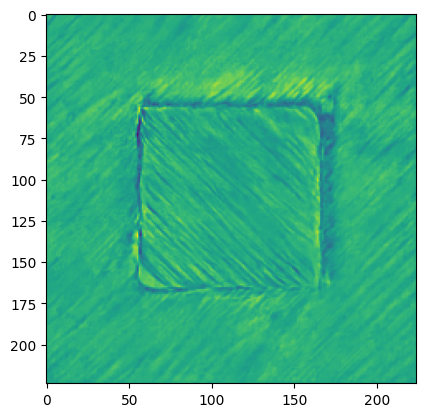

In [406]:
plt.imshow(selected_grad_patterns1[-1][0, 0].detach().cpu().numpy())
plt.show()

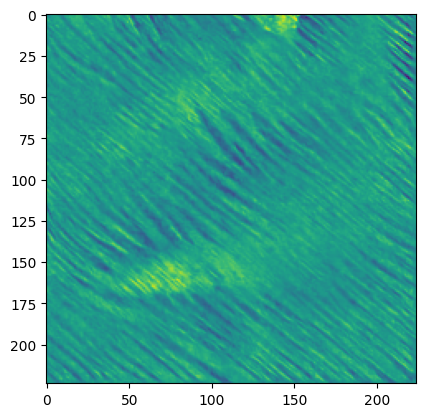

In [407]:
plt.imshow(selected_grad_patterns2[-1][0, 0].detach().cpu().numpy())
plt.show()

## Bar plot for the Receptive fields on the edges


/tmp/ipykernel_536847/3068944804.py:121: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


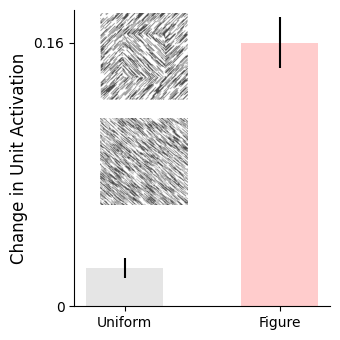

saved at: /home/tahereh/engram/users/Tahereh/Research/Results/Generative_Inference/imagenet-advrobust_L2_eps_3.00-100/Receptive_field_bar_onedge_rightFigureGroundLamme_FigureGroundUniform_layer3_geninf_imagenet_advrobust_L2_eps_3.00_epoch100_ReverseDiffusion_MSE_noise_ratio0.5_diffusion_noise_ratio0.005_n_itr101_eps20_step_size0.8.pdf


In [450]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image

edge = 'right'
baseline_pattern1 = selected_inferred_patterns1[0]
baseline_pattern2 = selected_inferred_patterns2[0]

# baseline_pattern1 = torch.ones_like(selected_inferred_patterns1[0])
# baseline_pattern2 = torch.ones_like(selected_inferred_patterns2[0])

def get_rect_points(x_start, x_end, y_start, y_end, spacing=2):
    """Generate points along a rectangle edge."""
    points = []
    for x in range(x_start, x_end + 1, spacing):
        for y in range(y_start, y_end + 1, spacing):
            points.append((y, x))
    return points

# Example sizes
image_size = 224
# Define edge coordinates

startx = image_size // 4   # 56
starty = 3*image_size // 4-5   # 56
sizex = image_size // 2
sizey = 10

def get_activations(patterns, patten_baseline, startx, starty, sizex, sizey):
    area_acts = []
    area_sems = []
    for pattern in patterns:
        # Get points along the rectangle
        selected_points = get_rect_points(startx, startx + sizex, starty, starty + sizey)
        pattern = patten_baseline - pattern  # also accounting for zero showing black
        # Calculate activations for all points
        point_activations = []
        for y, x in selected_points:
            if 0 <= x < image_size and 0 <= y < image_size:
                activation = (pattern[0, :, x, y]).mean().item()
                point_activations.append(activation)
        
        avg_activation = torch.tensor(point_activations).mean()
        sem_activation = torch.tensor(point_activations).std() / torch.sqrt(torch.tensor(len(point_activations)))
        area_acts.append(avg_activation)
        area_sems.append(sem_activation)
        
    return torch.stack(area_acts), torch.stack(area_sems)


figure_acts, figure_sems = get_activations(selected_inferred_patterns1, baseline_pattern1, startx, starty, sizex, sizey)
uniform_acts, uniform_sems = get_activations(selected_inferred_patterns2, baseline_pattern2, startx, starty, sizex, sizey)

# Convert to numpy
figure_mean = figure_acts.cpu().numpy()
uniform_mean = uniform_acts.cpu().numpy()
figure_sem = figure_sems.cpu().numpy()
uniform_sem = uniform_sems.cpu().numpy()

# # Create the main plot
fig, ax = plt.subplots(figsize=(3.5, 3.5))  # Adjust figure size


ax.bar([0, 0.5], [uniform_mean[-1], figure_mean[-1]], color=['gray', 'red'], alpha=0.2, width=0.25)
ax.errorbar([0, 0.5], [uniform_mean[-1], figure_mean[-1]], [uniform_sem[-1], figure_sem[-1]], fmt='none', color='black')

ax.set_xticks([0, 0.5])
ax.set_xticklabels(['Uniform', 'Figure'])

ax.set_ylim([0, 0.18])
ax.set_yticks([0, 0.16])
ax.set_yticklabels([0, 0.16])

# ax.bar([0, 0.25], [uniform_mean[0], uniform_mean[-1]], color=['gray', 'gray'], alpha=0.2, width=0.25)
# ax.bar([1, 1.25], [figure_mean[0], figure_mean[-1]], color=['red', 'red'], alpha=0.2, width=0.25)
# ax.errorbar([0, 0.25], [uniform_mean[0], uniform_mean[-1]], [uniform_sem[0], uniform_sem[-1]], fmt='none', color='gray')
# ax.errorbar([1, 1.25], [figure_mean[0], figure_mean[-1]], [figure_sem[0], figure_sem[-1]], fmt='none', color='red')
# Customize axes and labels
# ax.set_xlabel('Iteration', fontsize=12)
ax.set_ylabel('Change in Unit Activation', fontsize=12)
ax.tick_params(axis='both', labelsize=10)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# ax.set_ylim([0, 0.04])
# ax.set_yticks([0, 0.04])
# ax.set_yticklabels([0, 0.04])

# ax.set_xlim([0, iteration_numbers[-1]])

# Add legend
# ax.legend(fontsize=10, loc='upper left', frameon=False)

# Remove grid for cleaner look
ax.grid(False)

# Create inset with sampling points
inset_ax_figure = fig.add_axes([0.3, 0.7, 0.25, 0.25])
inset_ax_uniform = fig.add_axes([0.3, 0.4, 0.25, 0.25])
# Resize image using PIL
image1 = image1.resize((224, 224))

inset_ax_figure.imshow(image1, cmap='gray', alpha=0.7)  # Add transparency to the image

image2 = image2.resize((224, 224))
inset_ax_uniform.imshow(image2, cmap='gray', alpha=0.7)  # Add transparency to the image

# Plot sampling points on inset
selected_points = get_rect_points(startx, startx + sizex, starty, starty + sizey)
x_points = [x for y, x in selected_points]
y_points = [y for y, x in selected_points]

# Plot with corrected coordinates
# inset_ax_figure.plot(y_points, x_points, 'o', color='red', markersize=0.5, alpha=0.1)
# inset_ax_uniform.plot(y_points, x_points, 'o', color='gray', markersize=0.5, alpha=0.1)

# Customize inset appearance
inset_ax_figure.axis('off')  # Hide axis for cleaner visualization
inset_ax_uniform.axis('off')  # Hide axis for cleaner visualization
plt.tight_layout()
plt.show()

# Save the figure
fig_name_receptivefield = f'Receptive_field_bar_onedge_{edge}' + fig_name

fig.savefig(os.path.join(figsave_dir, fig_name_receptivefield + '.pdf'), dpi=300, bbox_inches='tight')
print('saved at:', os.path.join(figsave_dir, fig_name_receptivefield + '.pdf'))

## The Receptive filed on one edge

/tmp/ipykernel_536847/2314383584.py:108: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


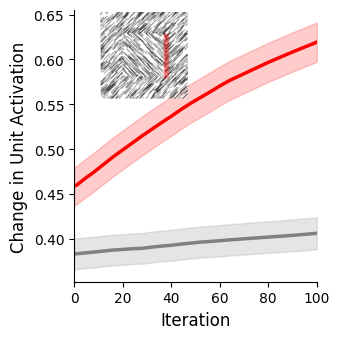

In [423]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image

edge = 'right'
# baseline_pattern1 = selected_inferred_patterns1[0]
# baseline_pattern2 = selected_inferred_patterns2[0]

baseline_pattern1 = torch.ones_like(selected_inferred_patterns1[0])
baseline_pattern2 = torch.ones_like(selected_inferred_patterns2[0])

def get_rect_points(x_start, x_end, y_start, y_end, spacing=2):
    """Generate points along a rectangle edge."""
    points = []
    for x in range(x_start, x_end + 1, spacing):
        for y in range(y_start, y_end + 1, spacing):
            points.append((y, x))
    return points

# Example sizes
image_size = 224
# Define edge coordinates

startx = image_size // 4   # 56
starty = 3*image_size // 4-5   # 56
sizex = image_size // 2
sizey = 10

def get_activations(patterns, patten_baseline, startx, starty, sizex, sizey):
    area_acts = []
    area_sems = []
    for pattern in patterns:
        # Get points along the rectangle
        selected_points = get_rect_points(startx, startx + sizex, starty, starty + sizey)
        pattern = patten_baseline - pattern  # also accounting for zero showing black
        # Calculate activations for all points
        point_activations = []
        for y, x in selected_points:
            if 0 <= x < image_size and 0 <= y < image_size:
                activation = (pattern[0, :, x, y]).mean().item()
                point_activations.append(activation)
        
        avg_activation = torch.tensor(point_activations).mean()
        sem_activation = torch.tensor(point_activations).std() / torch.sqrt(torch.tensor(len(point_activations)))
        area_acts.append(avg_activation)
        area_sems.append(sem_activation)
        
    return torch.stack(area_acts), torch.stack(area_sems)


figure_acts, figure_sems = get_activations(selected_inferred_patterns1, baseline_pattern1, startx, starty, sizex, sizey)
uniform_acts, uniform_sems = get_activations(selected_inferred_patterns2, baseline_pattern2, startx, starty, sizex, sizey)

# Convert to numpy
figure_mean = figure_acts.cpu().numpy()
uniform_mean = uniform_acts.cpu().numpy()
figure_sem = figure_sems.cpu().numpy()
uniform_sem = uniform_sems.cpu().numpy()

# Create the main plot
fig, ax = plt.subplots(figsize=(3.5, 3.5))  # Adjust figure size

# Plot activation curves
ax.plot(iteration_numbers, figure_mean, 'red', linewidth=2.5, label='Figure')
ax.plot(iteration_numbers, uniform_mean, 'gray', linewidth=2.5, label='Uniform')

# Add shaded error bars
ax.fill_between(iteration_numbers, figure_mean - figure_sem, figure_mean + figure_sem, color='red', alpha=0.2)
ax.fill_between(iteration_numbers, uniform_mean - uniform_sem, uniform_mean + uniform_sem, color='gray', alpha=0.2)

# Customize axes and labels
ax.set_xlabel('Iteration', fontsize=12)
ax.set_ylabel('Change in Unit Activation', fontsize=12)
ax.tick_params(axis='both', labelsize=10)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# ax.set_ylim([0, 0.04])
# ax.set_yticks([0, 0.04])
# ax.set_yticklabels([0, 0.04])

ax.set_xlim([0, iteration_numbers[-1]])

# Add legend
# ax.legend(fontsize=10, loc='upper left', frameon=False)

# Remove grid for cleaner look
ax.grid(False)

# Create inset with sampling points
inset_ax = fig.add_axes([0.3, 0.7, 0.25, 0.25])
# Resize image using PIL
image1 = image1.resize((224, 224))

inset_ax.imshow(image1, cmap='gray', alpha=0.7)  # Add transparency to the image

# Plot sampling points on inset
selected_points = get_rect_points(startx, startx + sizex, starty, starty + sizey)
x_points = [x for y, x in selected_points]
y_points = [y for y, x in selected_points]

# Plot with corrected coordinates
inset_ax.plot(y_points, x_points, 'o', color='red', markersize=0.5, alpha=0.1)

# Customize inset appearance
inset_ax.axis('off')  # Hide axis for cleaner visualization
plt.tight_layout()
plt.show()

# Save the figure
fig_name_receptivefield = f'Receptive_field_onedge_{edge}' + fig_name

# fig.savefig(os.path.join(figsave_dir, fig_name_receptivefield + '.pdf'), dpi=300, bbox_inches='tight')
# print('saved at:', os.path.join(figsave_dir, fig_name_receptivefield + '.pdf'))

## The change over all the square

In [7]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image

def get_rect_points(x_start, x_end, y_start, y_end, spacing=2):
    """Generate points along a rectangle edge."""
    points = []
    for x in range(x_start, x_end + 1, spacing):
        for y in range(y_start, y_end + 1, spacing):
            points.append((y, x))
    return points

# Example sizes
image_size = 224
# Define square coordinates
startx = image_size // 4 - 5  # 56
starty = image_size // 4 - 5  # 56
sizex = image_size // 2 + 10  # 112
sizey = image_size // 2 + 10  # 112

def get_activations(patterns, patten_baseline, startx, starty, sizex, sizey):
    area_acts = []
    area_sems = []
    for pattern in patterns:
        # Get points along the rectangle
        selected_points = get_rect_points(startx, startx + sizex, starty, starty + sizey)
        pattern = patten_baseline - pattern  # also accounting for zero showing black
        # Calculate activations for all points
        point_activations = []
        for y, x in selected_points:
            if 0 <= x < image_size and 0 <= y < image_size:
                activation = (pattern[0, :, x, y]).mean().item()
                point_activations.append(activation)
        
        avg_activation = torch.tensor(point_activations).mean()
        sem_activation = torch.tensor(point_activations).std() / torch.sqrt(torch.tensor(len(point_activations)))
        area_acts.append(avg_activation)
        area_sems.append(sem_activation)
        
    return torch.stack(area_acts), torch.stack(area_sems)


figure_acts, figure_sems = get_activations(selected_inferred_patterns1, selected_inferred_patterns1[0], startx, starty, sizex, sizey)
uniform_acts, uniform_sems = get_activations(selected_inferred_patterns2, selected_inferred_patterns2[0], startx, starty, sizex, sizey)

# Convert to numpy
figure_mean = figure_acts.cpu().numpy()
uniform_mean = uniform_acts.cpu().numpy()
figure_sem = figure_sems.cpu().numpy()
uniform_sem = uniform_sems.cpu().numpy()

# Create the main plot
fig, ax = plt.subplots(figsize=(3.5, 3.5))  # Adjust figure size

# Plot activation curves
ax.plot(iteration_numbers, figure_mean, 'red', linewidth=2.5, label='Figure')
ax.plot(iteration_numbers, uniform_mean, 'gray', linewidth=2.5, label='Uniform')

# Add shaded error bars
ax.fill_between(iteration_numbers, figure_mean - figure_sem, figure_mean + figure_sem, color='red', alpha=0.2)
ax.fill_between(iteration_numbers, uniform_mean - uniform_sem, uniform_mean + uniform_sem, color='gray', alpha=0.2)

# Customize axes and labels
ax.set_xlabel('Iteration', fontsize=12)
ax.set_ylabel('Change in Unit Activation', fontsize=12)
ax.tick_params(axis='both', labelsize=10)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_ylim([0, 0.04])
ax.set_yticks([0, 0.04])
ax.set_yticklabels([0, 0.04])

ax.set_xlim([0, iteration_numbers[-1]])

# Add legend
# ax.legend(fontsize=10, loc='upper left', frameon=False)

# Remove grid for cleaner look
ax.grid(False)

# Create inset with sampling points
inset_ax = fig.add_axes([0.3, 0.7, 0.25, 0.25])
# Resize image using PIL
image1 = image1.resize((224, 224))

inset_ax.imshow(image1, cmap='gray', alpha=0.7)  # Add transparency to the image

# Plot sampling points on inset
selected_points = get_rect_points(startx, startx + sizex, starty, starty + sizey)
x_points = [x for y, x in selected_points]
y_points = [y for y, x in selected_points]

# Plot with corrected coordinates
inset_ax.plot(y_points, x_points, 'o', color='red', markersize=0.5, alpha=0.1)

# Customize inset appearance
inset_ax.axis('off')  # Hide axis for cleaner visualization
plt.tight_layout()
plt.show()

# Save the figure
fig_name_receptivefield = f'Receptive_field_' + fig_name

fig.savefig(os.path.join(figsave_dir, fig_name_receptivefield + '.pdf'), dpi=300, bbox_inches='tight')
print('saved at:', os.path.join(figsave_dir, fig_name_receptivefield + '.pdf'))

NameError: name 'selected_inferred_patterns1' is not defined

In [8]:
## test the generative inference function
from Stimuli.load_stimuli import ImageLoader
from Inference.Generative_infernece import generative_inference

model_config = {'model': model, 'dataset_model': args.dataset_model, **model_args}
## pretty print the model_config
inference_config = {'loss_infer': 'ReverseDiffusion',# #'IncreaseConfidence', #'ReverseDiffusion', 
                    'loss_function': 'MSE',#'MSE',# #'CE', #'MSE', 
                    'n_itr':101, 
                    'eps': 20, #0.5, 
                    'step_size': 0.8, #3
                    'diffusion_noise_ratio': 0.005,#0.05, 
                    'initial_inference_noise_ratio': 0.5,#0.05, #0.1, 
                    # 'iterations_to_show': [0, 1,  4, 8, 16, 20, 30, 40, 60, 80, 90, 100],
                    'iterations_to_show': [0, 1, 2, 4, 8, 16, 20, 24, 28, 32, 36, 40, 44, 48, 52, 56, 60, 64, 80, 90, 100],
                    # 'iterations_to_show': [0, 1, 2, 4, 16, 32, 64, 80, 100, 200, 400, 500, 600, 700, 800, 900, 1000],
                    'top_layer': 'layer3', #'layer4', #'avgpool', #'all',
                    'inference_normalization': 'off',
                    'recognition_normalization': 'off',
                    'misc_info': {'keep_grads': True,}
                    }



image_name =  'FigureGroundCircle' #'FigureGroundLamme' ##'FigureGroundTexture' #'FigureGroundUniform' #'FigureGroundLamme'# 'FigureGroundLammeBordersDetected' #'FigureGroundLamme'
image, cmap = ImageLoader(args.dataset_model).load_image(image_name)


selected_inferred_patterns, perceived_categories, confidence_list, misc_info_dict = generative_inference(model_config, image, inference_config)
iteration_numbers = inference_config['iterations_to_show']
if inference_config['misc_info']['keep_grads']:
    selected_grad_patterns = misc_info_dict['grad_info']
else:
    selected_grad_patterns = []

Kernel running on local computer 'demo'.
['tench', 'goldfish', 'great white shark', 'tiger shark', 'hammerhead shark']
image names:  ('self', 'image_name', 'image_original', 'cmap')
Kernel running on local computer 'demo'.
['tench', 'goldfish', 'great white shark', 'tiger shark', 'hammerhead shark']
image names:  ('self', 'image_name', 'image_original', 'cmap')


Kernel running on local computer 'demo'.
['tench', 'goldfish', 'great white shark', 'tiger shark', 'hammerhead shark']
image names:  ('self', 'image_name', 'image_original', 'cmap')


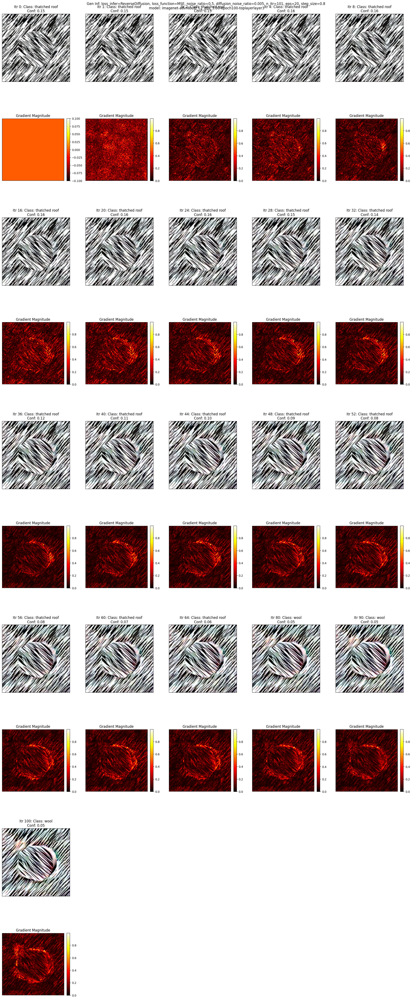

saved at: /home/tahereh/engram/users/Tahereh/Research/Results/Generative_Inference/imagenet-advrobust_L2_eps_3.00-100/FigureGroundCircle_layer3_geninf_imagenet_advrobust_L2_eps_3.00_epoch100_ReverseDiffusion_MSE_noise_ratio0.5_diffusion_noise_ratio0.005_n_itr101_eps20_step_size0.8_confitr0_False_with_gradients.pdf


In [9]:
import matplotlib.pyplot as plt
import numpy as np
import os
import torch

# show the images and gradients in a grid - now with 2 rows per pattern
n_cols = 5
n_pattern_rows = len(selected_inferred_patterns)//n_cols + (1 if len(selected_inferred_patterns)%n_cols > 0 else 0)
if n_pattern_rows == 0:
    n_pattern_rows = 1
# Double the rows to accommodate gradients below each image
n_total_rows = n_pattern_rows * 2
fig, axes = plt.subplots(n_total_rows, n_cols, figsize=[20, 5*n_pattern_rows * 2])

if model_config['dataset_model'] == 'vggface2':
    norm_mean = torch.tensor([0.5,0.5,0.5]).view(-1, 1, 1).cuda()
    norm_std = torch.tensor([0.5,0.5,0.5]).view(-1, 1, 1).cuda()
elif model_config['dataset_model'] == 'imagenet' or model_config['dataset_model'] == 'imagenetvggface2':
    norm_mean = torch.tensor([0.485, 0.456, 0.406]).view(-1, 1, 1).cuda()
    norm_std = torch.tensor([0.229, 0.224, 0.225]).view(-1, 1, 1).cuda()

for i in range(len(selected_inferred_patterns)):
    # Calculate positions for image and gradient
    row_idx = (i // n_cols) * 2  # Multiply by 2 to skip rows for gradients
    col_idx = i % n_cols
    
    # Get axes for both image and gradient
    if n_pattern_rows == 1:
        ax_img = axes[0] if n_cols == 1 else axes[col_idx]
        ax_grad = axes[1] if n_cols == 1 else axes[n_cols + col_idx]
    else:
        ax_img = axes[row_idx, col_idx]
        ax_grad = axes[row_idx + 1, col_idx]
        
    # Get the image and corresponding gradients
    image_to_compute = selected_inferred_patterns[i].squeeze(0).detach().cpu().numpy().transpose(1,2,0)
    gradients = selected_grad_patterns[i].squeeze(0).detach().cpu().numpy().transpose(1,2,0)
    
    # Normalize gradients for visualization
    grad_magnitude = np.sqrt(np.sum(gradients**2, axis=2))
    grad_normalized = (grad_magnitude - grad_magnitude.min()) / (grad_magnitude.max() - grad_magnitude.min() + 1e-8)
        
    
    predicted_emotion = 'N/A'
    confidence_emotion = 0
    first_itr_conf_got_high = 0
    emotion_detected = False
    color_title = 'black'
    
    # Plot image in top subplot
    ax_img.imshow(image_to_compute)
    # Plot gradient heatmap in bottom subplot
    gradient_plot = ax_grad.imshow(grad_normalized, cmap='hot')
    plt.colorbar(gradient_plot, ax=ax_grad, fraction=0.046, pad=0.04)
    
    # Set titles
    if model_config['dataset_model'] == 'imagenet':
        ax_img.set_title(f'Itr {iteration_numbers[i]}: Class: {labels_imagenet[perceived_categories[i]]}\nConf: {confidence_list[i]:.2f}', color=color_title)
    else:
        ax_img.set_title(f'Itr {iteration_numbers[i]}: Class: {perceived_categories[i]}\nConf: {confidence_list[i]:.2f}', color=color_title)
    
    ax_grad.set_title('Gradient Magnitude')
    
    # Remove ticks from both subplots
    ax_img.set_xticks([])
    ax_img.set_yticks([])
    ax_grad.set_xticks([])
    ax_grad.set_yticks([])

fig.suptitle(f'Gen Inf: loss_infer={inference_config["loss_infer"]}, loss_function={inference_config["loss_function"]}, noise_ratio={inference_config["initial_inference_noise_ratio"]}, diffusion_noise_ratio={inference_config["diffusion_noise_ratio"]}, n_itr={inference_config["n_itr"]}, eps={inference_config["eps"]}, step_size={inference_config["step_size"]}\n model: {args.dataset_model}-{args.model_training}-epoch{args.epoch_chkpnt}-toplayer{inference_config["top_layer"]}')

# Remove empty axes
for i in range(n_total_rows):
    for j in range(n_cols):
        pattern_idx = (i//2) * n_cols + j
        if pattern_idx >= len(selected_inferred_patterns):
            if n_pattern_rows > 1:
                fig.delaxes(axes[i, j])

plt.tight_layout()
plt.show()

# Save figure
figsave_dir = os.path.join(resultsdir, f'{args.dataset_model}-{args.model_training}-{args.epoch_chkpnt}/')
if not os.path.exists(figsave_dir):
    os.makedirs(figsave_dir)

fig_name = f'{image_name}_{inference_config["top_layer"]}_geninf_{model_config["dataset_model"]}_{model_config["model_training"]}_epoch{model_config["epoch_chkpnt"]}_{inference_config["loss_infer"]}_{inference_config["loss_function"]}_noise_ratio{inference_config["initial_inference_noise_ratio"]}_diffusion_noise_ratio{inference_config["diffusion_noise_ratio"]}_n_itr{inference_config["n_itr"]}_eps{inference_config["eps"]}_step_size{inference_config["step_size"]}'
fig_name = fig_name + f'_confitr{first_itr_conf_got_high}_{emotion_detected}_with_gradients'

instance_counter = 0
while os.path.exists(os.path.join(figsave_dir, fig_name+'.pdf')):
    print('file already exists, adding instance number')
    if 'instance' in fig_name:
        fig_name = fig_name.split('_instance')[0]
    fig_name = fig_name + f'_instance{instance_counter}'
    instance_counter += 1

fig.savefig(os.path.join(figsave_dir, fig_name+'.pdf'), dpi=300, bbox_inches='tight')
print('saved at:', os.path.join(figsave_dir, fig_name+'.pdf'))

# Save results dictionary
dict_results = {
    'model_config': model_config,
    'inference_config': inference_config,
    'selected_inferred_patterns': selected_inferred_patterns,
    'selected_grad_patterns': selected_grad_patterns,
    'perceived_categories': perceived_categories,
    'iteration_numbers': iteration_numbers,

}
np.save(os.path.join(figsave_dir, fig_name+'.npy'), dict_results)

In [10]:
## save a copy of the resulted fig in the resultsdir
path_save_a_copy_significant = os.path.join(resultsdir,'Selected_to_inspect',  fig_name+'.pdf')
fig.savefig(path_save_a_copy_significant, dpi=300, bbox_inches='tight')
print('saved a copy of the resulted fig at:', path_save_a_copy_significant)


saved a copy of the resulted fig at: /home/tahereh/engram/users/Tahereh/Research/Results/Generative_Inference/Selected_to_inspect/FigureGroundCircle_layer3_geninf_imagenet_advrobust_L2_eps_3.00_epoch100_ReverseDiffusion_MSE_noise_ratio0.5_diffusion_noise_ratio0.005_n_itr101_eps20_step_size0.8_confitr0_False_with_gradients.pdf
